In [11]:
import problem
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

In [12]:
X_train, y_train = problem.get_train_data()
X_test, y_test = problem.get_test_data()

In [13]:
pipeline = problem.get_estimator()

In [14]:
pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

pipe_score = mean_squared_error(y_test, y_pred)
print(pipe_score)

0.13188927695403366


In [15]:
X_eval = problem.get_eval_data()

In [30]:
y_pred = pipeline.predict(X_eval)
results = pd.DataFrame(
    dict(
        Id=np.arange(y_pred.shape[0]),
        log_bike_count=y_pred,
    )
)
results.to_csv("submission.csv", index=False)

In [31]:
X_transformed = problem._encode_data(X_eval)

In [37]:
comparison_date = pd.to_datetime('2021-09-15')
for i in range(len(X_eval)):
    if X_transformed['counter_id'][i] == 0 or X_transformed['counter_id'][i] == 1:
        if  X_eval['date'][i] >= comparison_date:
            results['log_bike_count'][i] = 0
results.to_csv("submission.csv", index=False)

/var/folders/h7/h7_133ss2_94d2x6m450xlnc0000gn/T/ipykernel_79545/2170062183.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['log_bike_count'][i] = 0
/var/folders/h7/h7_133ss2_94d2x6m450xlnc0000gn/T/ipykernel_79545/2170062183.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['log_bike_count'][i] = 0
/var/folders/h7/h7_133ss2_94d2x6m450xlnc0000gn/T/ipykernel_79545/2170062183.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versu

In [35]:
results.to_csv("submission.csv", index=False)

In [2]:
# Load the data
X_train, y_train, X_test, y_test = problem.get_transformed_data()

# Train XGBoost model
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train, y_train)

# Train LightGBM model
lgb_model = lgb.LGBMRegressor()
lgb_model.fit(X_train, y_train)

# Make predictions
xgb_preds = xgb_model.predict(X_test)
lgb_preds = lgb_model.predict(X_test)


# Calculate score
xgb_score = mean_squared_error(y_test, xgb_preds, squared=False)
lgb_score = mean_squared_error(y_test, lgb_preds, squared=False)

# Print results
print("XGBoost accuracy:", xgb_score)
print("LightGBM accuracy:", lgb_score)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 203
[LightGBM] [Info] Number of data points in the train set: 496827, number of used features: 6
[LightGBM] [Info] Start training from score 3.079917
XGBoost accuracy: 0.3631656329473284
LightGBM accuracy: 0.436785578171438


In [65]:
X_test_date,_ = problem.get_test_data()
X_test_date = X_test_date['date']

/var/folders/h7/h7_133ss2_94d2x6m450xlnc0000gn/T/ipykernel_8768/4011501954.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(12, 4))


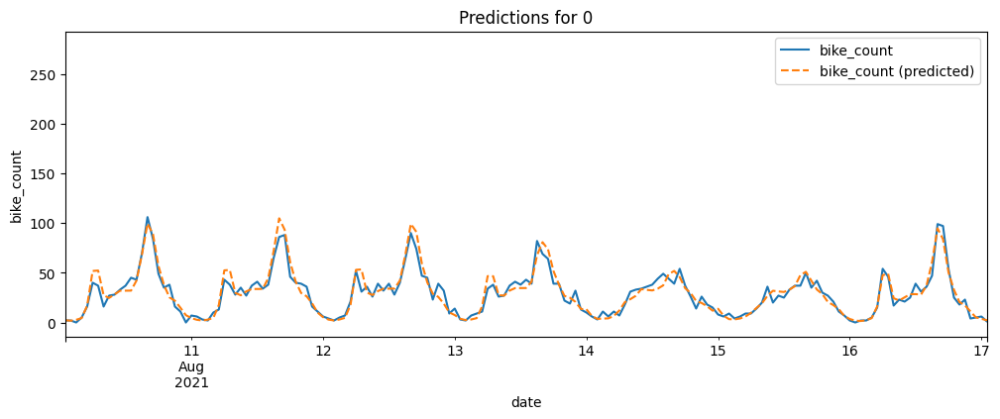

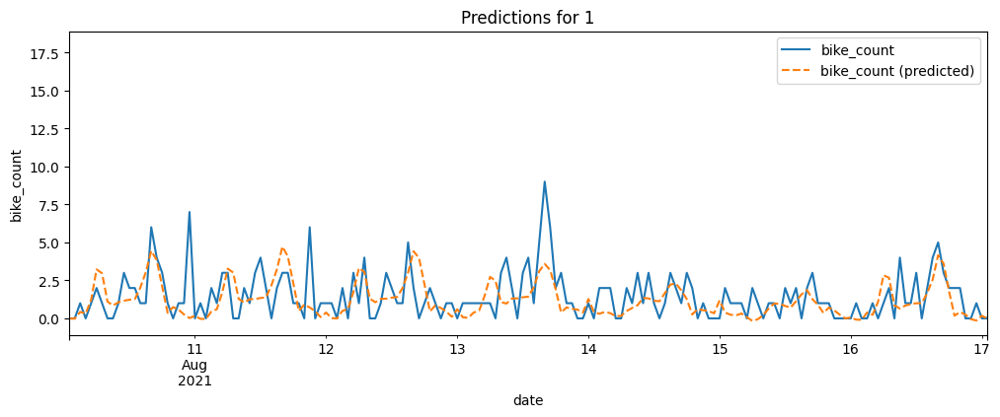

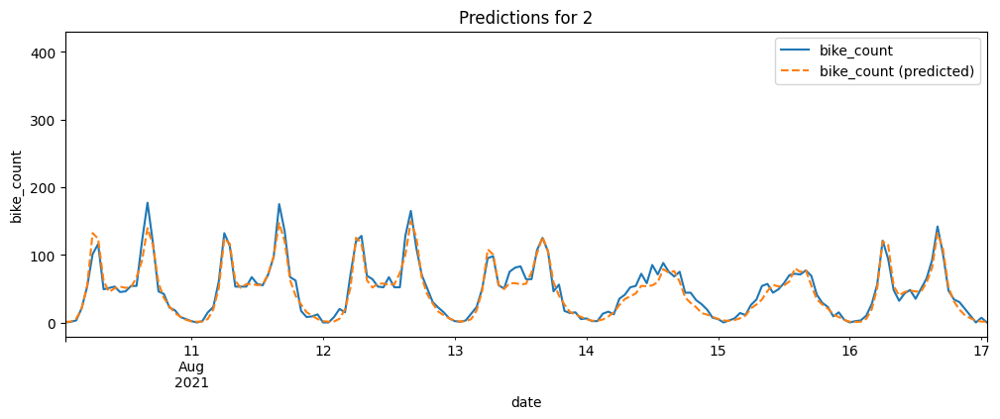

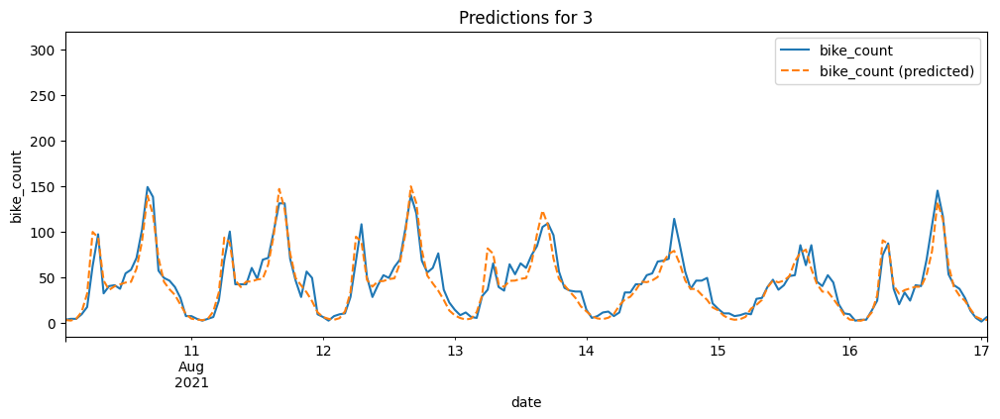

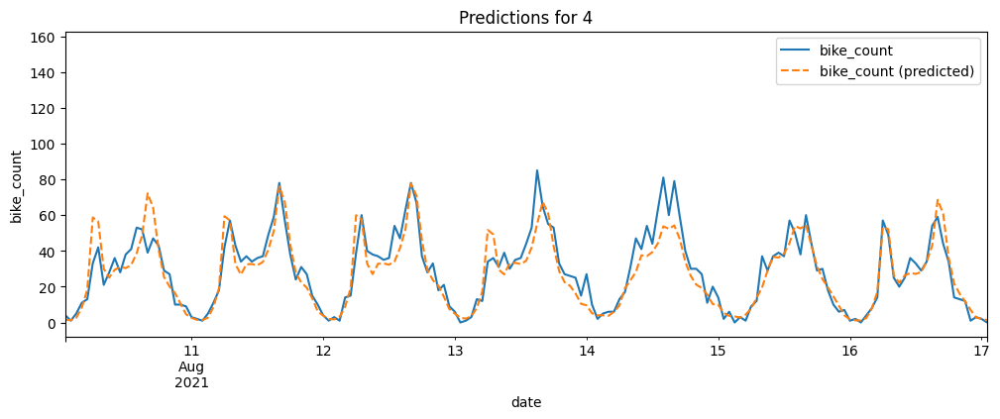

...

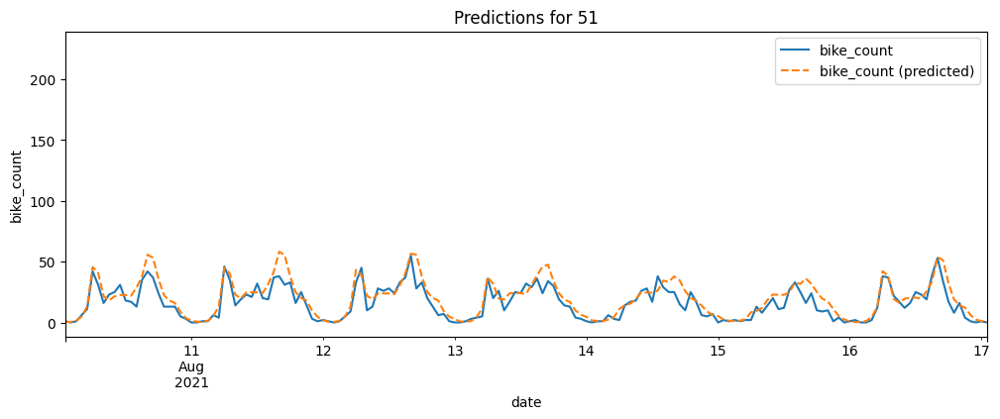

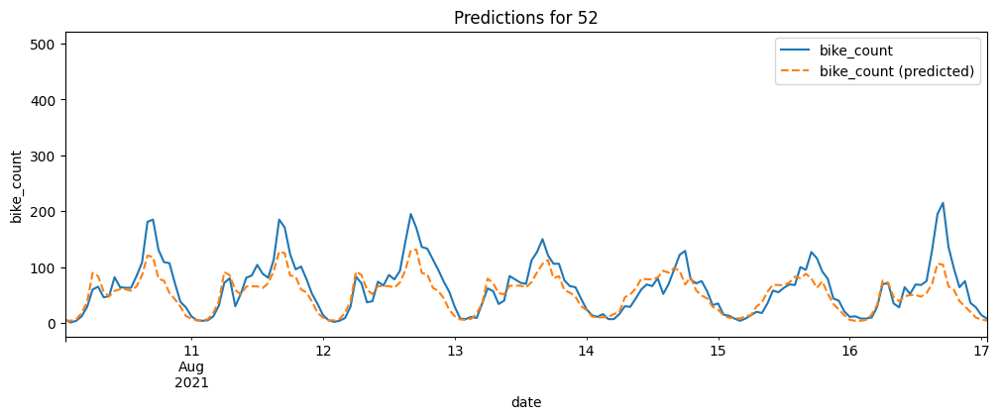

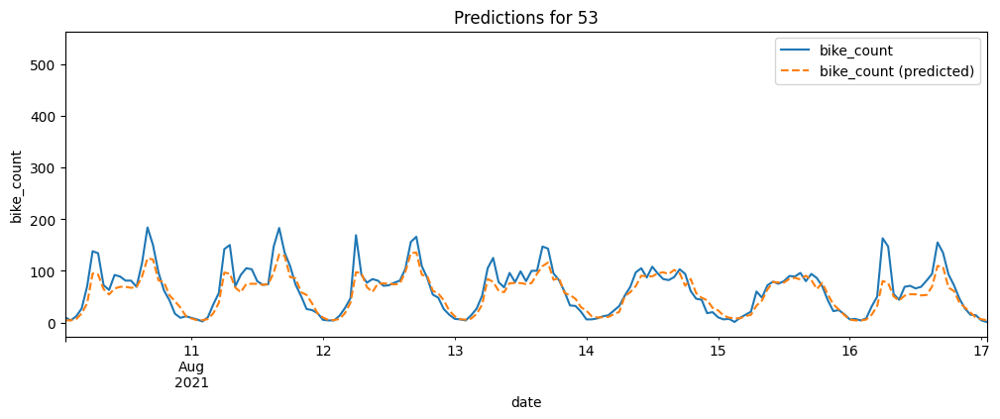

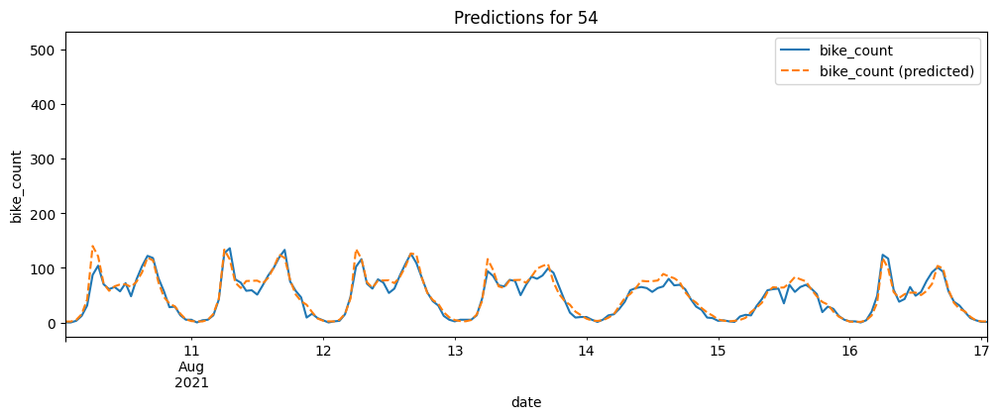

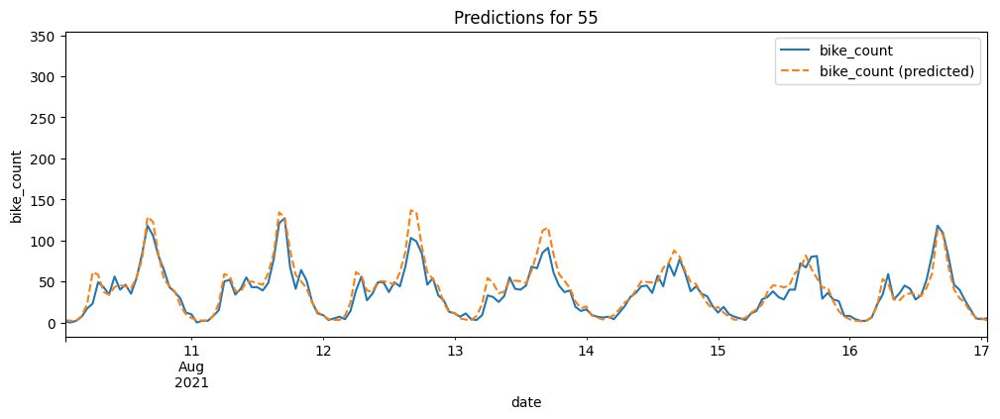

In [110]:
for i in range(56):

    mask = (
        (X_test["counter_id"] == i)
    )

    df_viz = X_test.loc[mask].copy()
    df_viz["bike_count"] = np.exp(y_test[mask.values]) - 1
    df_viz["bike_count (predicted)"] = np.exp(xgb_model.predict(X_test[mask])) - 1
    df_viz["date"] = X_test_date[mask.values]
    fig, ax = plt.subplots(figsize=(12, 4))

    df_viz.plot(x="date", y="bike_count", ax=ax)
    df_viz.plot(x="date", y="bike_count (predicted)", ax=ax, ls="--")
    ax.set_title("Predictions for {}".format(i))
    ax.set_ylabel("bike_count")
    ax.set_xlim((X_test_date[mask.values].min(), X_test_date[mask.values].min() + pd.Timedelta(days=7)))

In [7]:
X_eval = problem.get_eval_data()

In [8]:
X_eval.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51440 entries, 17081 to 6855
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   counter_id                 51440 non-null  category      
 1   counter_name               51440 non-null  category      
 2   site_id                    51440 non-null  int64         
 3   site_name                  51440 non-null  category      
 4   date                       51440 non-null  datetime64[us]
 5   counter_installation_date  51440 non-null  datetime64[us]
 6   coordinates                51440 non-null  category      
 7   counter_technical_id       51440 non-null  category      
 8   latitude                   51440 non-null  float64       
 9   longitude                  51440 non-null  float64       
dtypes: category(5), datetime64[us](2), float64(2), int64(1)
memory usage: 2.6 MB


In [9]:
start_date = X_eval['date'].min()
end_date = X_eval['date'].max()
print("Start date:", start_date)
print("End date:", end_date)


Start date: 2021-09-10 01:00:00
End date: 2021-10-18 21:00:00


In [106]:
import os

In [153]:
X_eval = problem.get_transform_eval_data()
X_train = pd.read_parquet(os.path.join(".", "data", "train.parquet"))
X_train["date"] = X_train["date"] + pd.DateOffset(years=1) - pd.DateOffset(days=1)
X_eval_date = problem.get_eval_data()
X_eval_counter = pd.concat([X_eval_date['counter_id'],X_eval['counter_id']], axis=1)
X_eval_date = X_eval_date['date']

In [154]:
l = []
for i in range(56):
    mask = X_eval_counter['counter_id'] == i
    l.append(X_eval_counter[mask.values].iloc[0,0])

/var/folders/h7/h7_133ss2_94d2x6m450xlnc0000gn/T/ipykernel_8768/3529847662.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(12, 4))


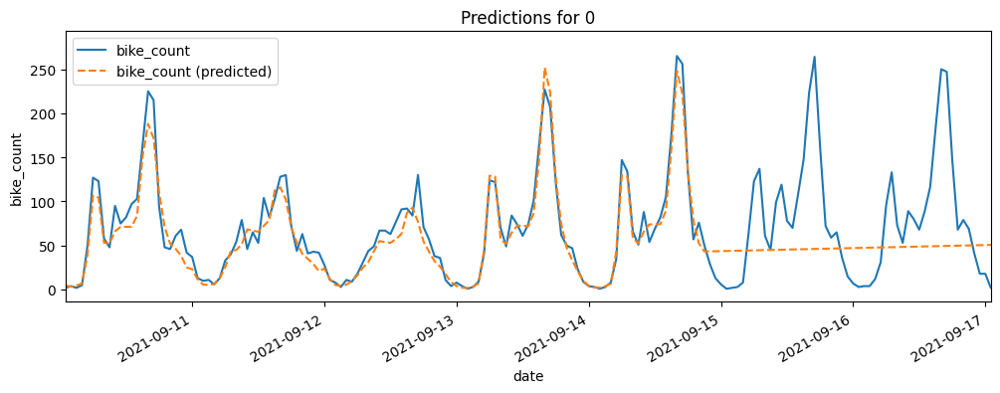

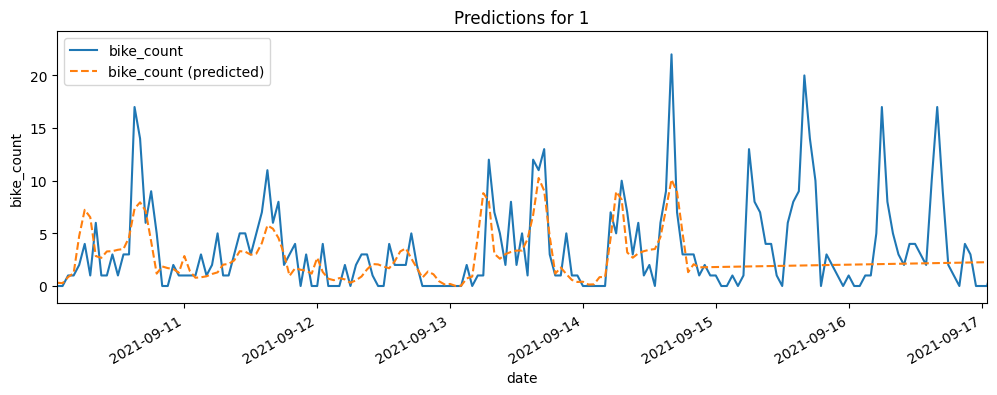

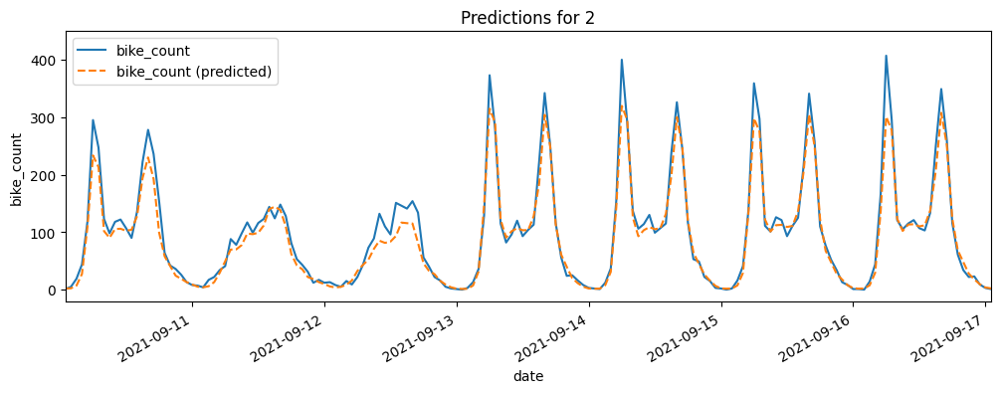

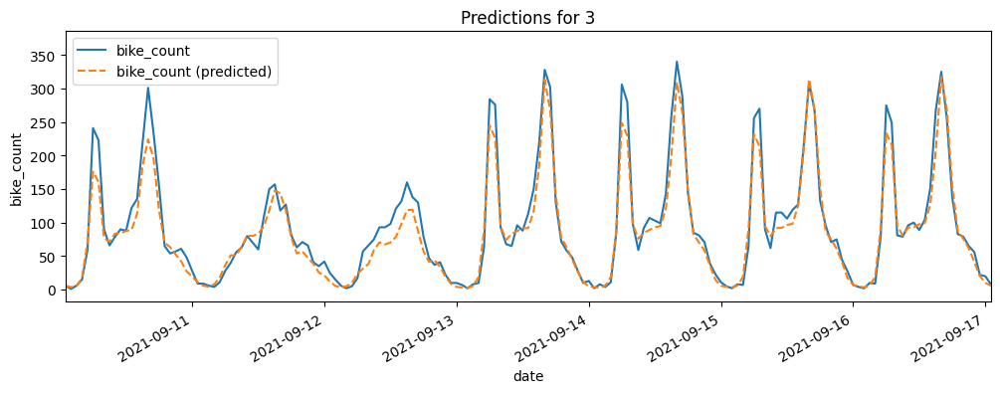

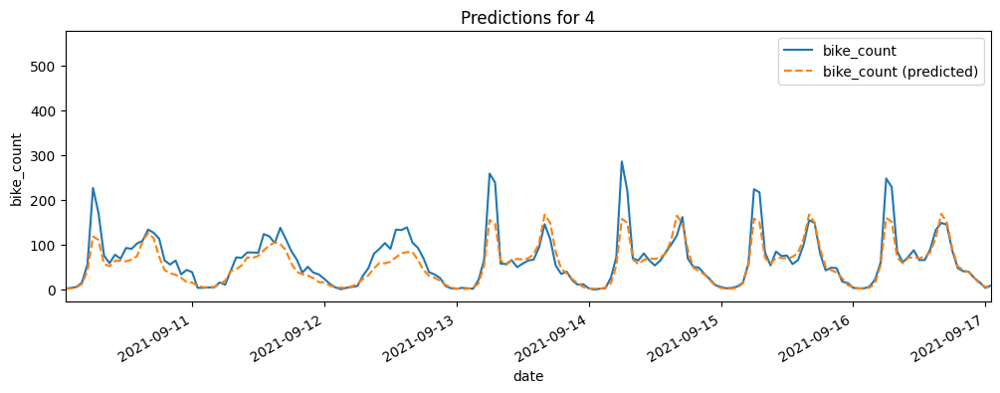

...

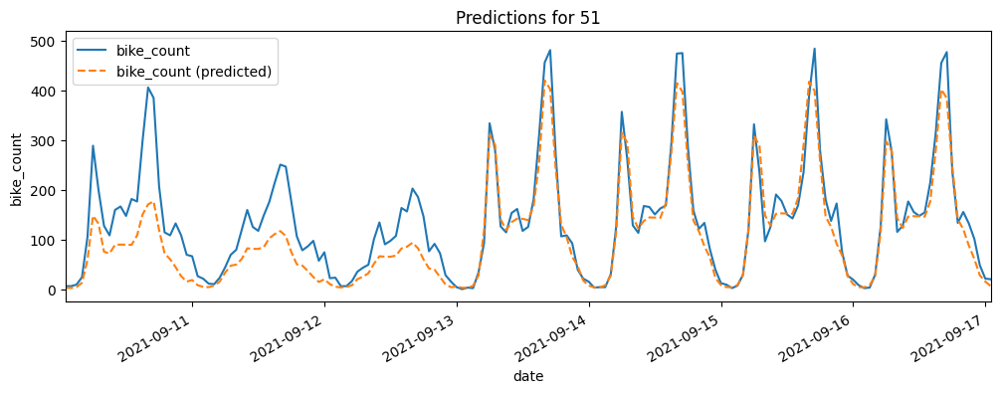

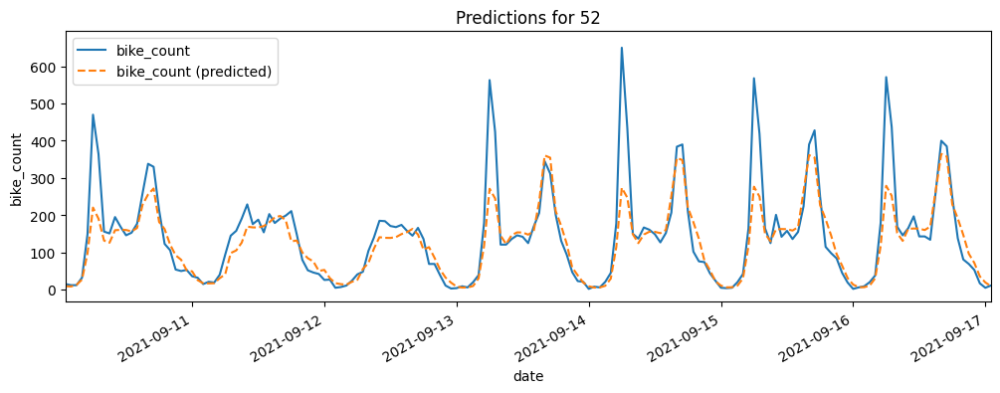

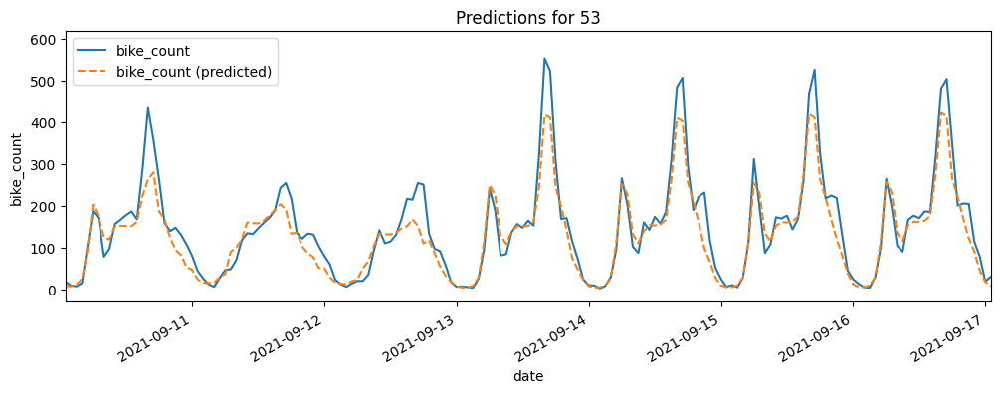

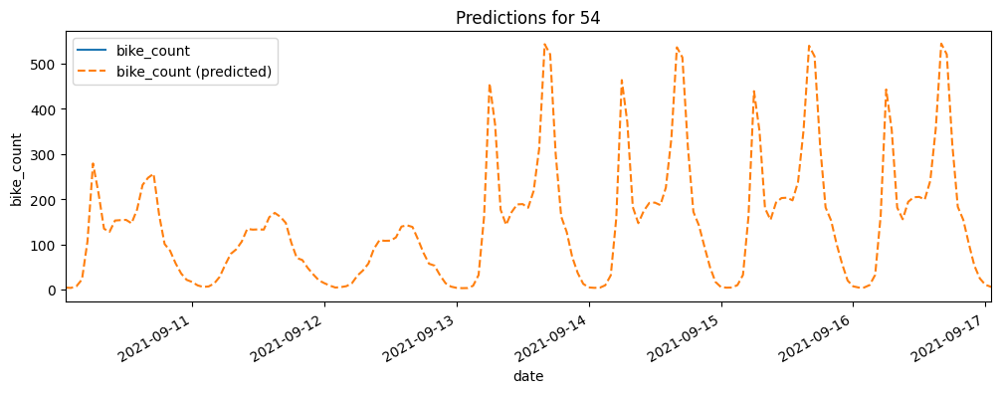

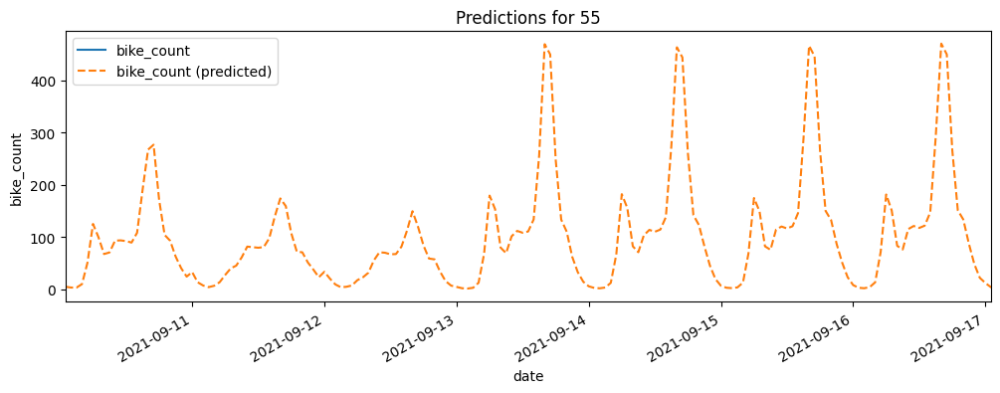

In [155]:
for i in range(56):

    mask = (
        (X_eval["counter_id"] == i)
    )

    df_viz = X_eval.loc[mask].copy()
    
    df_viz["bike_count (predicted)"] = np.exp(xgb_model.predict(X_eval[mask])) - 1
    df_viz["date"] = X_eval_date[mask.values]
    fig, ax = plt.subplots(figsize=(12, 4))
    
    mask2 = X_train["counter_id"] == l[i]
    X_train[mask2].plot(x="date", y="bike_count", ax=ax)
    df_viz.plot(x="date", y="bike_count (predicted)", ax=ax, ls="--")
    ax.set_title("Predictions for {}".format(i))
    ax.set_ylabel("bike_count")
    ax.set_xlim((X_eval_date[mask.values].min(), X_eval_date[mask.values].min() + pd.Timedelta(days=7)))

In [50]:
X = problem.get_eval_data()
df = pd.concat([X, pd.Series(y_pred, name='log_bike_count')], axis=1)
df.head()


,counter_id,counter_name,site_id,site_name,date,counter_installation_date,coordinates,counter_technical_id,latitude,longitude,log_bike_count
17081,100049407-353255860,152 boulevard du Montparnasse E-O,100049407,152 boulevard du Montparnasse,2021-09-10 01:00:00,2018-12-07,"48.840801,2.333233",Y2H19070373,48.840801,2.333233,1.024188
18655,100049407-353255859,152 boulevard du Montparnasse O-E,100049407,152 boulevard du Montparnasse,2021-09-10 01:00:00,2018-12-07,"48.840801,2.333233",Y2H19070373,48.840801,2.333233,5.925084
3124,100036719-104036719,18 quai de l'Hôtel de Ville NO-SE,100036719,18 quai de l'Hôtel de Ville,2021-09-10 01:00:00,2017-07-12,"48.85372,2.35702",Y2H19027732,48.853720,2.357020,4.792960
4147,100036719-103036719,18 quai de l'Hôtel de Ville SE-NO,100036719,18 quai de l'Hôtel de Ville,2021-09-10 01:00:00,2017-07-12,"48.85372,2.35702",Y2H19027732,48.853720,2.357020,1.630929
48210,100063175-353277233,20 Avenue de Clichy NO-SE,100063175,20 Avenue de Clichy,2021-09-10 01:00:00,2020-07-22,"48.88529,2.32666",Y2H20073268,48.885290,2.326660,4.331018


In [ ]:
fig, axs = plt.subplots(8, 7, figsize=(20, 20))
axs = axs.flatten()

for i, counter_name in enumerate(df["counter_name"].unique()[:56]):
    mask = df["counter_name"] == counter_name
    df[mask].plot(x="date", y="log_bike_count", ax=axs[i])
    axs[i].set_title(counter_name)
    axs[i].set_xlabel("")
    axs[i].set_ylabel("Bike Count")
    
plt.tight_layout()

<Axes: xlabel='date'>

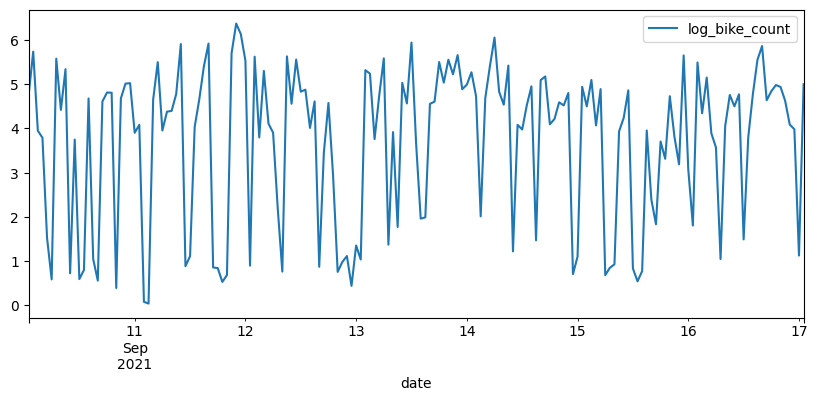

In [53]:
fig, ax = plt.subplots(figsize=(10, 4))

mask = (
    (df["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (df["date"] <= start_date + pd.Timedelta(days=7))
)

df[mask].plot(x="date", y="log_bike_count", ax=ax)

In [24]:
X_train, y_train = problem.get_train_data()

In [33]:
from pathlib import Path

In [54]:
df = pd.read_parquet(Path("data") / "train.parquet")
df.head()

,counter_id,counter_name,site_id,site_name,bike_count,date,counter_installation_date,coordinates,counter_technical_id,latitude,longitude,log_bike_count
48321,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,0.0,2020-09-01 02:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.000000
48324,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,1.0,2020-09-01 03:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.693147
48327,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,0.0,2020-09-01 04:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,0.000000
48330,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,4.0,2020-09-01 15:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,1.609438
48333,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,9.0,2020-09-01 18:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429,2.302585


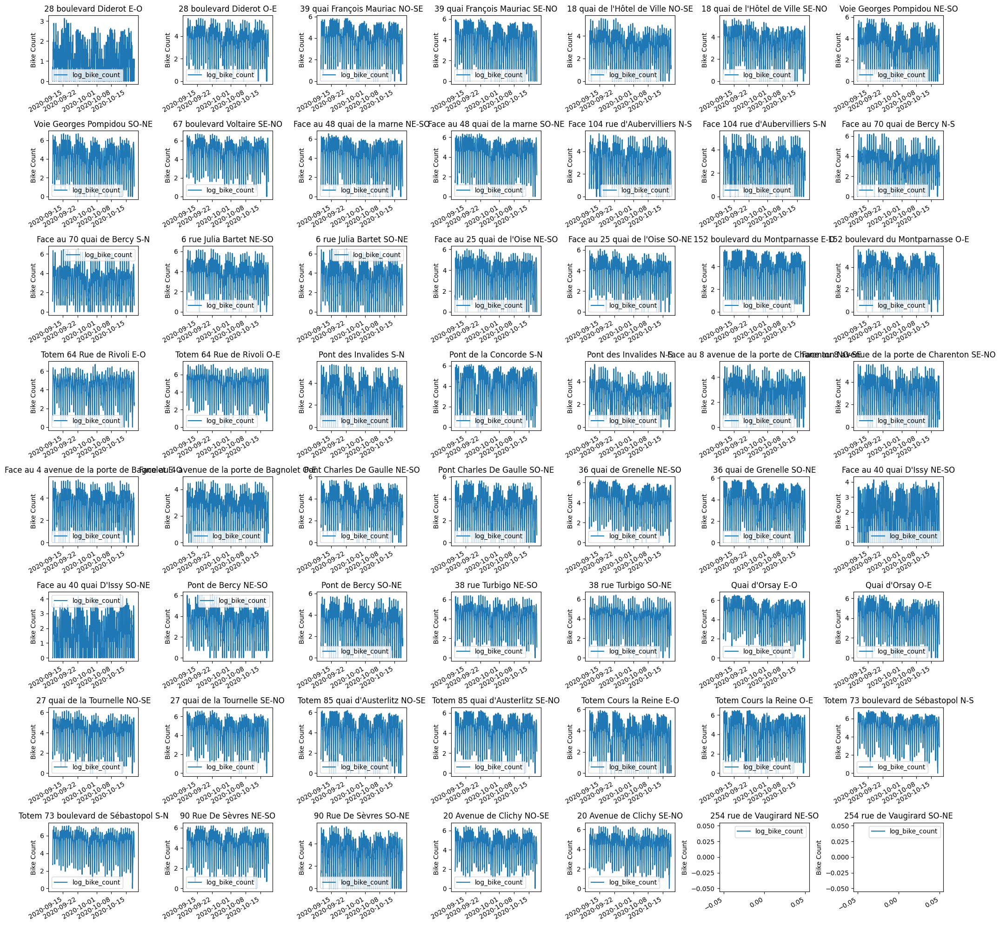

In [49]:
fig, axs = plt.subplots(8, 7, figsize=(20, 20))
axs = axs.flatten()

for i, counter_name in enumerate(df["counter_name"].unique()[:56]):
    mask = (df["counter_name"] == counter_name) & (df["date"] >= start_date - pd.DateOffset(years=1)) & (df["date"] <= end_date - pd.DateOffset(years=1))
    df[mask].plot(x="date", y="log_bike_count", ax=axs[i])
    axs[i].set_title(counter_name)
    axs[i].set_xlabel("")
    axs[i].set_ylabel("Bike Count")
    
plt.tight_layout()


<Axes: xlabel='date'>

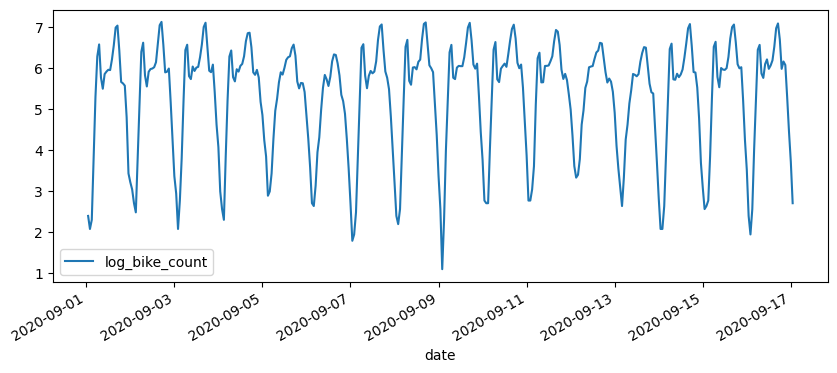

In [57]:
fig, ax = plt.subplots(figsize=(10, 4))

mask = (
    (df["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (df["date"] <= start_date + pd.Timedelta(days=7)- pd.DateOffset(years=1))
)

df[mask].plot(x="date", y="log_bike_count", ax=ax)

In [7]:
import os

In [8]:
raw_eval = pd.read_parquet(os.path.join(".", "data", "final_test.parquet"))

In [9]:
raw_eval.head()

,counter_id,counter_name,site_id,site_name,date,counter_installation_date,coordinates,counter_technical_id,latitude,longitude
0,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,2021-09-10 01:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429
1,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,2021-09-10 13:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429
2,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,2021-09-10 17:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429
3,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,2021-09-10 19:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429
4,100007049-102007049,28 boulevard Diderot E-O,100007049,28 boulevard Diderot,2021-09-10 22:00:00,2013-01-18,"48.846028,2.375429",Y2H15027244,48.846028,2.375429


In [3]:
X_eval = problem.get_transform_eval_data()

In [4]:
X_eval.head()

,counter_id,latitude,longitude,week,weekday,hour
0,1,48.846028,2.375429,36,4,1
1,1,48.846028,2.375429,36,4,13
2,1,48.846028,2.375429,36,4,17
3,1,48.846028,2.375429,36,4,19
4,1,48.846028,2.375429,36,4,22


In [5]:
y_pred = xgb_model.predict(X_eval)
results = pd.DataFrame(
    dict(
        Id=np.arange(y_pred.shape[0]),
        log_bike_count=y_pred,
    )
)
results.to_csv("submission.csv", index=False)